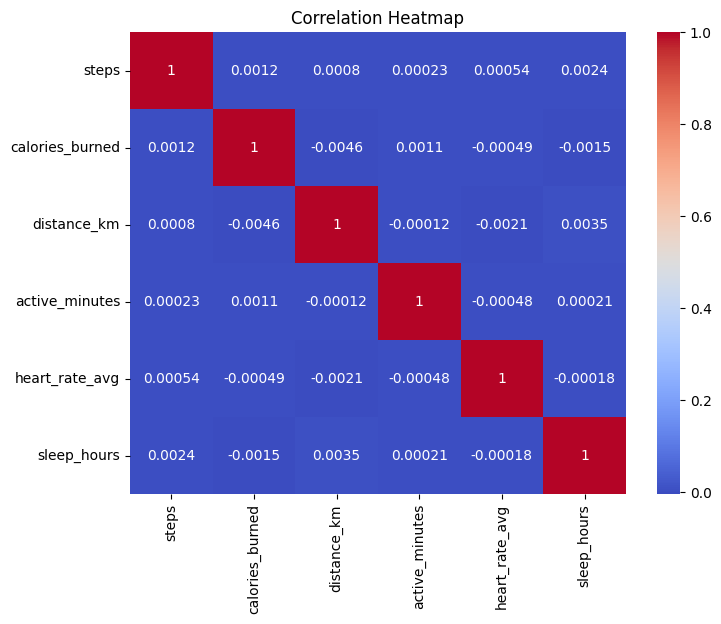

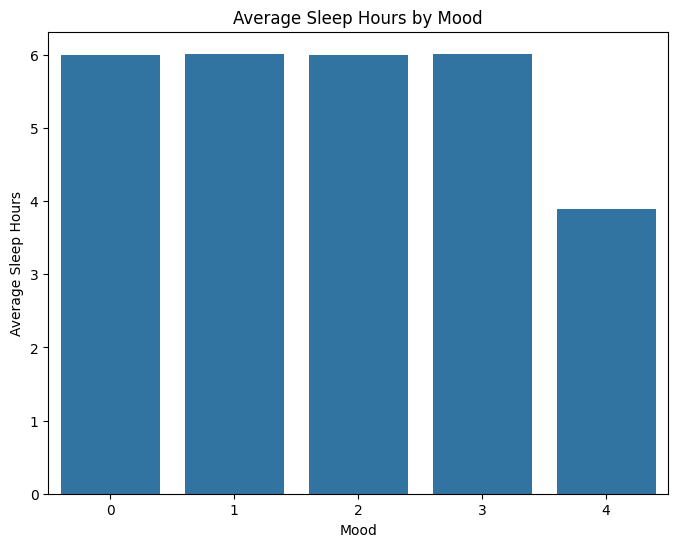

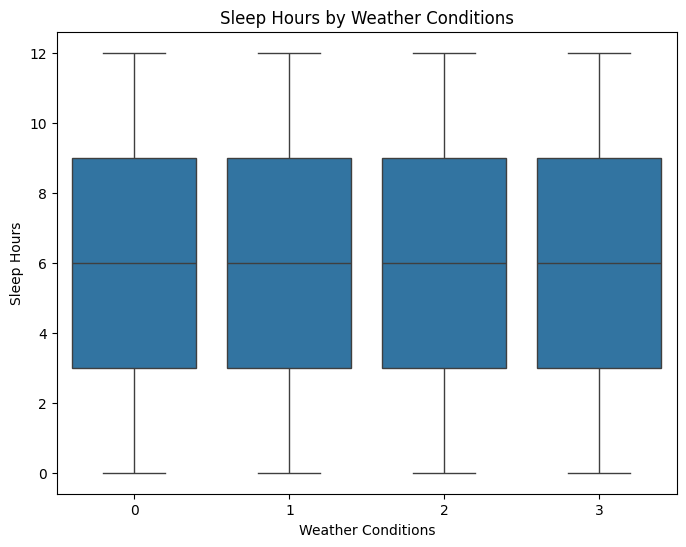

<ipython-input-5-9c36dee83639>:174: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.




Comprehensive Sleep Analysis Results:

Lifestyle Factors Impact:
Workout Impact (p-value): 0.7498
Mood Impact (p-value): 0.8853
Activity Correlation: 0.0002

Environmental Factors Impact:
Weather Impact (p-value): 0.5879
Location Impact (p-value): 0.5081

Predictive Model Performance:
Mean Squared Error: 11.9848
R-squared: -0.0001


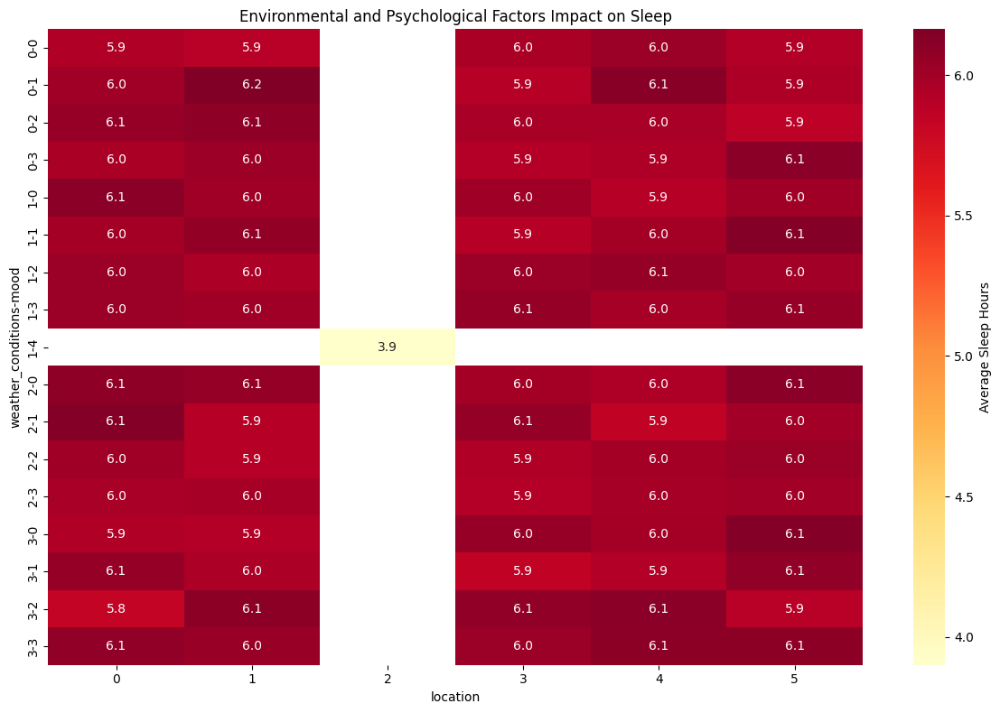

In [8]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from plotly.subplots import make_subplots
from scipy import stats
from IPython.display import Image

# Load the dataset
data = pd.read_csv("/content/drive/MyDrive/fitness_tracker_dataset.csv")
df = pd.DataFrame(data)

# Data Pre-Processing
def preprocess_data(df):
    # Handle missing values (impute instead of dropping)
    df.fillna({
        'steps': df['steps'].median(),
        'calories_burned': df['calories_burned'].median(),
        'distance_km': df['distance_km'].median(),
        'active_minutes': df['active_minutes'].median(),
        'sleep_hours': df['sleep_hours'].median(),
        'heart_rate_avg': df['heart_rate_avg'].median(),
        'workout_type': 'Unknown',
        'weather_conditions': 'Unknown',
        'location': 'Unknown',
        'mood': 'Unknown'
    }, inplace=True)

    # Convert 'date' to datetime
    df['date'] = pd.to_datetime(df['date'])

    # Encode categorical variables
    label_encoders = {}
    categorical_cols = ['workout_type', 'weather_conditions', 'location', 'mood']
    for col in categorical_cols:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])
        label_encoders[col] = le

    # Feature Engineering: Create sleep quality categories
    df['sleep_quality'] = pd.cut(df['sleep_hours'], bins=[0, 4, 7, 12], labels=['Poor', 'Fair', 'Good'])

    # Normalize numerical features
    scaler = StandardScaler()
    numerical_cols = ['steps', 'calories_burned', 'distance_km', 'active_minutes', 'heart_rate_avg']
    df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

    return df, label_encoders

# Preprocess the data
df, label_encoders = preprocess_data(df)

# Analysis Tasks
def perform_analysis(df):
    # Task 1: Correlation Analysis
    corr_matrix = df[['steps', 'calories_burned', 'distance_km', 'active_minutes', 'heart_rate_avg', 'sleep_hours']].corr()

    # Task 2: Group Comparisons
    sleep_by_mood = df.groupby('mood')['sleep_hours'].mean().reset_index()
    sleep_by_weather = df.groupby('weather_conditions')['sleep_hours'].mean().reset_index()

    # Task 3: Predictive Modeling
    X = df[['steps', 'calories_burned', 'distance_km', 'active_minutes', 'heart_rate_avg']]
    y = df['sleep_hours']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return corr_matrix, sleep_by_mood, sleep_by_weather, mse, r2

# Perform analysis
corr_matrix, sleep_by_mood, sleep_by_weather, mse, r2 = perform_analysis(df)

# Data Visualizations
def create_visualizations(df):
    # Static Visualizations
    # 1. Heatmap of Correlations
    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Heatmap')
    plt.show()

    # 2. Bar Chart of Sleep Quality by Mood
    plt.figure(figsize=(8, 6))
    sns.barplot(x='mood', y='sleep_hours', data=sleep_by_mood)
    plt.title('Average Sleep Hours by Mood')
    plt.xlabel('Mood')
    plt.ylabel('Average Sleep Hours')
    plt.show()

    # 3. Box Plot of Sleep Hours by Weather Conditions
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='weather_conditions', y='sleep_hours', data=df)
    plt.title('Sleep Hours by Weather Conditions')
    plt.xlabel('Weather Conditions')
    plt.ylabel('Sleep Hours')
    plt.show()

    # Interactive Visualizations
    # 1. Interactive Scatter Plot
    fig = px.scatter(df, x='steps', y='sleep_hours', color='mood', hover_data=['workout_type', 'weather_conditions'])
    fig.update_layout(title='Steps vs Sleep Hours')
    fig.show()

    # 2. Interactive Dashboard (using Plotly)
    fig = px.sunburst(df, path=['location', 'workout_type'], values='sleep_hours', color='sleep_hours')
    fig.update_layout(title='Sleep Hours by Location and Workout Type')
    fig.show()

    # 3. Time Series Plot
    fig = px.line(df, x='date', y='sleep_hours', color='user_id', title='Sleep Hours Over Time')
    fig.show()

# Create visualizations
create_visualizations(df)

# Advanced Analysis
def advanced_analysis(df):
    # Workout Timing Analysis
    df['workout_effectiveness'] = df.apply(
        lambda x: analyze_workout_timing(x['workout_type'], x['active_minutes'], x['sleep_hours']),
        axis=1
    )

    # Activity Intensity Analysis
    df['activity_intensity'] = pd.qcut(
        df['active_minutes'],
        q=4,
        labels=['Low', 'Moderate', 'High', 'Very High']
    )

    # Environmental Impact Analysis
    weather_impact, location_impact = analyze_environmental_impact(df)

    # Create Advanced Visualizations
    lifestyle_viz = create_lifestyle_visualization(df)
    environmental_map = create_environmental_heatmap(df)
    temporal_analysis = create_temporal_analysis(df)

    # Generate Comprehensive Report
    report = generate_comprehensive_report(df)

    # Save visualizations
    lifestyle_viz.write_html('lifestyle_impact.html')
    environmental_map.savefig('environmental_impact.png')
    temporal_analysis.write_html('temporal_analysis.html')

    # Print summary findings
    print("\nComprehensive Sleep Analysis Results:")
    print("\nLifestyle Factors Impact:")
    print(f"Workout Impact (p-value): {report['lifestyle_stats']['workout_impact'].pvalue:.4f}")
    print(f"Mood Impact (p-value): {report['lifestyle_stats']['mood_impact'].pvalue:.4f}")
    print(f"Activity Correlation: {report['lifestyle_stats']['activity_correlation'][0]:.4f}")

    print("\nEnvironmental Factors Impact:")
    print(f"Weather Impact (p-value): {report['environmental_stats']['weather_impact'].pvalue:.4f}")
    print(f"Location Impact (p-value): {report['environmental_stats']['location_impact'].pvalue:.4f}")

    print("\nPredictive Model Performance:")
    print(f"Mean Squared Error: {mse:.4f}")
    print(f"R-squared: {r2:.4f}")

# Perform advanced analysis
advanced_analysis(df)